In [1]:
# Takes a while to load all when you started 
from __future__ import print_function, unicode_literals, absolute_import, division
# Here import important system functions 
import os
import sys
# import tk for getting the directory faster. dont need this in a command line/server version
import tkinter as tk
from tkinter import *
from tkinter import filedialog
# you need numpy as always
import numpy as np
import csv
# if you dont need to plot in jupyter you don need these. Some magic interperters need to be removed for command line version. 
import matplotlib
matplotlib.rcParams["image.interpolation"] = 'none'
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
# Glob and tifffile are needed
from glob import glob
from tifffile import imread,imwrite
# csb deep is to take normalization 
from csbdeep.utils import Path, normalize
from csbdeep.io import save_tiff_imagej_compatible
# This is your stardist models and everything in stardist coming from. 
from stardist import random_label_cmap, _draw_polygons, export_imagej_rois
from stardist.models import StarDist2D
# Set random seed for you color map. You do not really need this to be 6 all the time, but its okay. 
np.random.seed(6)
lbl_cmap = random_label_cmap()

In [12]:
def open_file_dialog():
    root = tk.Tk()
    root.withdraw()  # Hide the main window

    file_path = filedialog.askdirectory()  # Open the file dialog window
    os.chdir(file_path)
    root.destroy()  # Destroy the root window after file selection
    return file_path

if __name__ == "__main__":
    selected_file_path = open_file_dialog()
    print("Selected file path:", selected_file_path)


2024-04-29 22:57:51.959 python[3063:87420] _TIPropertyValueIsValid called with 12 on nil context!
2024-04-29 22:57:51.959 python[3063:87420] imkxpc_setApplicationProperty:value:reply: called with incorrect property value 12, bailing.


Selected file path: /Users/eliasguan/Desktop/EG_Nucleus_Segementation_test/022523_smFISH_analysis_v2.0_development/Weekly_Reports/2024Spring/043024/Spot_counting_test


In [3]:
# First test a 3D on 4 stacks 
import bigfish
# import image: 
filenames = glob('Full*.tif')
stacked_image = imread(filenames[0])

In [4]:
import bigfish.detection
spots, threshold = bigfish.detection.detect_spots(
        images=stacked_image,
        return_threshold=True,
        voxel_size= (361*15,64,64),  # in nanometer (one value per dimension zyx)
        spot_radius= (600,250,250), # in nanometer (one value per dimension zyx)
        log_kernel_size= (2.5,1.3,1.3),
        minimum_distance= (1,2,2))

    # Out put your spot detection results as txt file
    # Also added a estimation of signal-to-noise ratio
np.save('spot.npy', spots)
with open ("spot_info.txt","w") as file :
    file.write("\r shape: {0}".format(spots.shape))
    file.write("\r dtype: {0}".format(spots.dtype))
    file.write("\r threshold: {0}".format(threshold))


In [15]:
# Load your full stack segmentation
def open_file_dialog():
    root = tk.Tk()
    root.withdraw()  # Hide the main window

    file_path = filedialog.askdirectory()  # Open the file dialog window
    os.chdir(file_path)
    root.destroy()  # Destroy the root window after file selection
    return file_path

if __name__ == "__main__":
    selected_file_path = open_file_dialog()
    print("Selected file path:", selected_file_path)

Selected file path: /Users/eliasguan/Desktop/EG_Nucleus_Segementation_test/022523_smFISH_analysis_v2.0_development/633/results


In [17]:
filenames_coord = glob('spot.npy')
coord = np.load(filenames_coord[0])


In [9]:
import bigfish.stack as stack
mip = stack.maximum_projection(stacked_image)

In [19]:
coord.shape

(1886, 3)

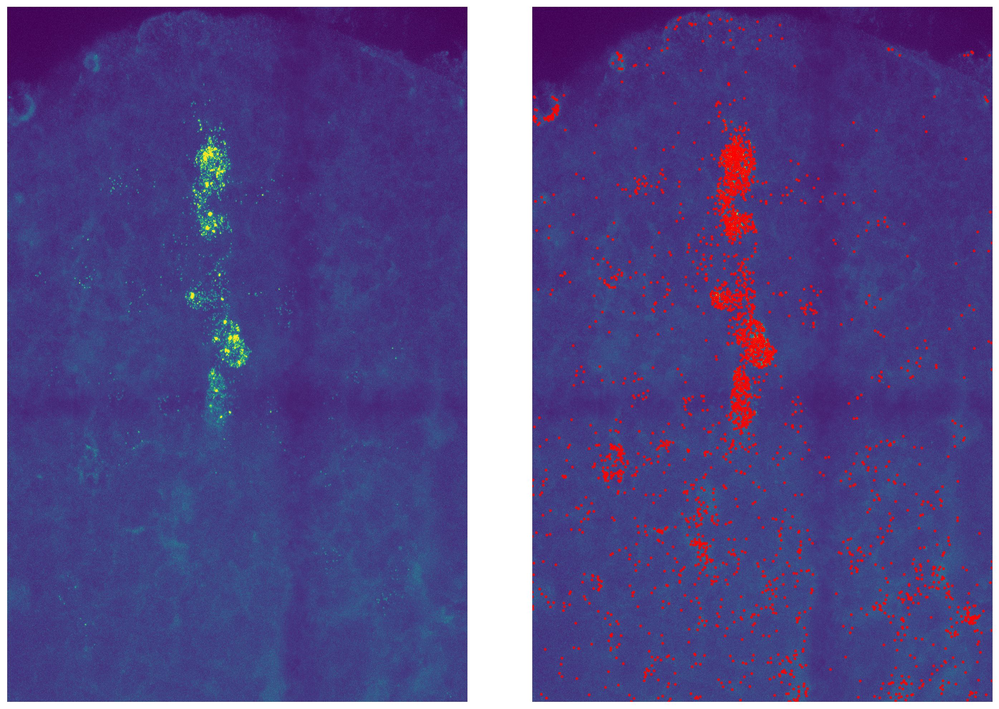

In [11]:
import bigfish.plot as plot
bigfish.plot.plot_detection(mip, spots, contrast=True)

In [16]:
filenames = sorted( glob('Maxproject*.tif'))

In [17]:
stack_one = imread(filenames[0])

In [28]:
spots_one, threshold = bigfish.detection.detect_spots(
        images=stack_one,
        return_threshold=True,
        voxel_size= (64,64),  # in nanometer (one value per dimension zyx)
        spot_radius= (250,250), # in nanometer (one value per dimension zyx)
        log_kernel_size= (1.3,1.3),
        minimum_distance= (2,2))

    # Out put your spot detection results as txt file
    # Also added a estimation of signal-to-noise ratio
np.save('stack_spot.npy', spots_one)
with open ("stack_1_spot_info.txt","w") as file :
    file.write("\r shape: {0}".format(spots_one.shape))
    file.write("\r dtype: {0}".format(spots_one.dtype))
    file.write("\r threshold: {0}".format(threshold))


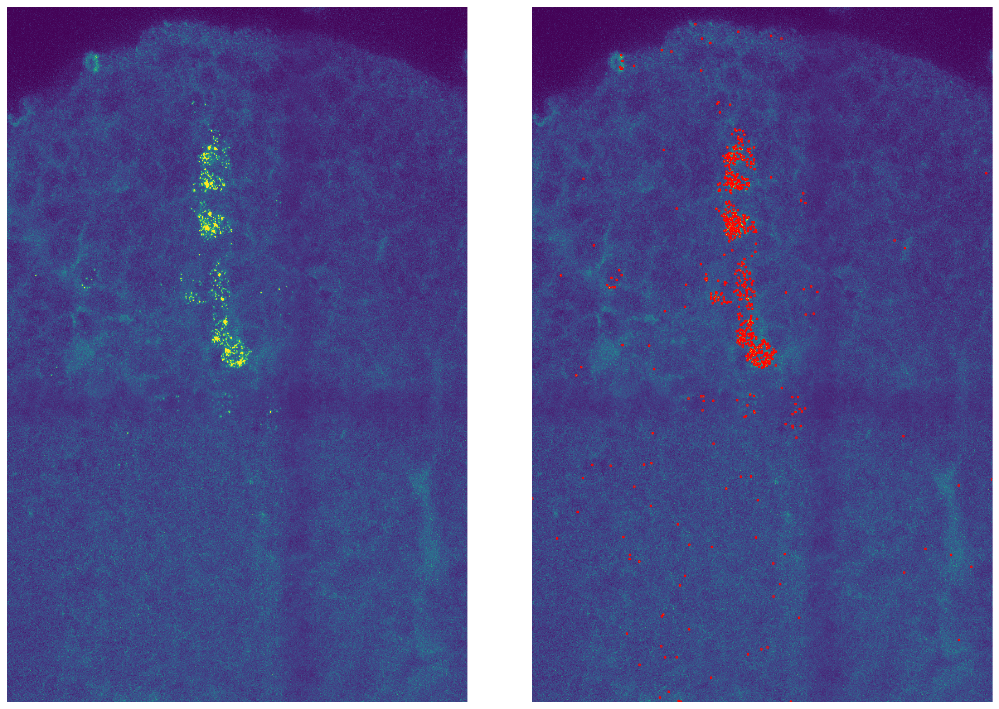

In [29]:
bigfish.plot.plot_detection(stack_one, spots_one, contrast=True)

In [20]:
def open_file_dialog():
    root = tk.Tk()
    root.withdraw()  # Hide the main window

    file_path = filedialog.askdirectory()  # Open the file dialog window
    os.chdir(file_path)
    root.destroy()  # Destroy the root window after file selection
    return file_path

if __name__ == "__main__":
    selected_file_path = open_file_dialog()
    print("Selected file path:", selected_file_path)

2024-04-30 00:10:51.134 python[3063:87420] _TIPropertyValueIsValid called with 12 on nil context!
2024-04-30 00:10:51.134 python[3063:87420] imkxpc_setApplicationProperty:value:reply: called with incorrect property value 12, bailing.
2024-04-30 00:10:56.017 python[3063:87420] _TIPropertyValueIsValid called with 12 on nil context!
2024-04-30 00:10:56.017 python[3063:87420] imkxpc_setApplicationProperty:value:reply: called with incorrect property value 12, bailing.
2024-04-30 00:11:08.095 python[3063:87420] _TIPropertyValueIsValid called with 12 on nil context!
2024-04-30 00:11:08.095 python[3063:87420] imkxpc_setApplicationProperty:value:reply: called with incorrect property value 12, bailing.


Selected file path: /Users/eliasguan/Desktop/EG_Nucleus_Segementation_test/022523_smFISH_analysis_v2.0_development/Weekly_Reports/2024Spring/042424/expanding labels test


In [23]:
from skimage import segmentation
filenames = glob('*000.tif')
dataset = dataset = list(map(imread,filenames))
expanded_labels = segmentation.expand_labels(dataset[0], distance=20)

In [33]:
from bigfish import multistack
multistack.extract_cell(cell_label = expanded_labels, ndim =2, rna_coord = spots_one)

[{'cell_id': 1,
  'bbox': (1079, 977, 1170, 1056),
  'cell_coord': array([[91, 12],
         [91, 11],
         [91, 10],
         [91, 10],
         [90,  9],
         [90,  9],
         [90,  8],
         [90,  8],
         [89,  7],
         [88,  6],
         [88,  6],
         [87,  6],
         [86,  6],
         [85,  6],
         [84,  6],
         [83,  6],
         [83,  6],
         [82,  5],
         [82,  5],
         [81,  5],
         [80,  5],
         [79,  5],
         [78,  5],
         [77,  5],
         [76,  5],
         [76,  5],
         [75,  4],
         [75,  4],
         [74,  4],
         [73,  4],
         [72,  4],
         [71,  4],
         [70,  4],
         [70,  4],
         [69,  3],
         [69,  3],
         [68,  3],
         [67,  3],
         [66,  3],
         [65,  3],
         [64,  3],
         [64,  3],
         [63,  2],
         [63,  2],
         [62,  2],
         [61,  2],
         [60,  2],
         [60,  2],
         [59,  1],
    

In [26]:
spots_one

array([[   0,   31,  641],
       [   0,   39,  538],
       [   0,   45,  683],
       ...,
       [   3, 2523,  360],
       [   3, 2523,  933],
       [   3, 2523,  938]])